## Question 1

Use [World Bank's Data Service](https://data.worldbank.org/) to retrieve

* Literacy rates of women (percentage of females ages 15 and above)
* Child mortality rate, under 5 year old. (per 1,000 live births)
* Gini index (Economic Inequality)

1. Plot each dataset for Turkey from earliest date available until this year.
2. Plot the same data for Greece, Bulgaria, Romania, Poland, Syria and Iran for the same periods. 
3. Do a scatter plot of female literacy rate against child mortality rate for Turkey. Do you see a relation? Which direction do you think the relation works?
4. Do a scatter plot of female literacy rate against gini index for Turkey. Do you see a relation? Which direction do you think the relation works?
5. Do a scatter plot of child mortality rate against the gini index for Turkey. Do you see a relation? Which direction do you think the relation works?

In [128]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import gzip
import seaborn as sns
from urllib.request import urlopen
from xmltodict import parse
from zipfile import ZipFile
from io import BytesIO
from scipy import stats
import folium
from sklearn.preprocessing import minmax_scale
import yfinance as yf
import math
from scipy.stats.stats import pearsonr



## Getting Data from  World Bank's Data Service

In [94]:
with urlopen('https://api.worldbank.org/v2/en/indicator/SE.ADT.LITR.FE.ZS?downloadformat=xml') as url:
    zfile = ZipFile(BytesIO(url.read()))
    print(zfile.filelist)
    data = parse(zfile.open('API_SE.ADT.LITR.FE.ZS_DS2_en_xml_v2_4651512.xml').read())

df =[{x['@name']: x['#text'] for x in y['field'] if '#text' in x.keys()} for y in data['Root']['data']['record']]
literacy_rate = pd.DataFrame(df)

[<ZipInfo filename='API_SE.ADT.LITR.FE.ZS_DS2_en_xml_v2_4651512.xml' compress_type=deflate file_size=4768054 compress_size=104459>]


In [95]:
with urlopen('https://api.worldbank.org/v2/en/indicator/SH.DYN.MORT?downloadformat=xml') as url:
    zfile = ZipFile(BytesIO(url.read()))
    print(zfile.filelist)
    data = parse(zfile.open('API_SH.DYN.MORT_DS2_en_xml_v2_4639508.xml').read())

df =[{x['@name']: x['#text'] for x in y['field'] if '#text' in x.keys()} for y in data['Root']['data']['record']]
child_mortality = pd.DataFrame(df)

[<ZipInfo filename='API_SH.DYN.MORT_DS2_en_xml_v2_4639508.xml' compress_type=deflate file_size=4533211 compress_size=119924>]


In [96]:
with urlopen('https://api.worldbank.org/v2/en/indicator/SI.POV.GINI?downloadformat=xml') as url:
    zfile = ZipFile(BytesIO(url.read()))
    print(zfile.filelist)
    data = parse(zfile.open('API_SI.POV.GINI_DS2_en_xml_v2_4639705.xml').read())

    
df=[{x['@name']: x['#text'] for x in y['field'] if '#text' in x.keys()} for y in data['Root']['data']['record']]
gini = pd.DataFrame(df)


[<ZipInfo filename='API_SI.POV.GINI_DS2_en_xml_v2_4639705.xml' compress_type=deflate file_size=3806005 compress_size=72157>]


## Editing Data

Since the value column is a string, I converted it to float. I assigned the year column to the index of the dataframe in order to process the data more easily.

In [97]:
literacy_rate = literacy_rate.astype({'Value':'float'})
literacy_rate = literacy_rate.set_index('Year')
child_mortality = child_mortality.astype({'Value':'float'})
child_mortality = child_mortality.set_index('Year')
gini = gini.astype({'Value':'float'})
gini = gini.set_index('Year')

## Plotting data for Turkey

For the value in Turkey, I selected and visualized the data whose "Country or Area" column is "Turkey".

Text(0.5, 1.0, 'Gini in Turkey')

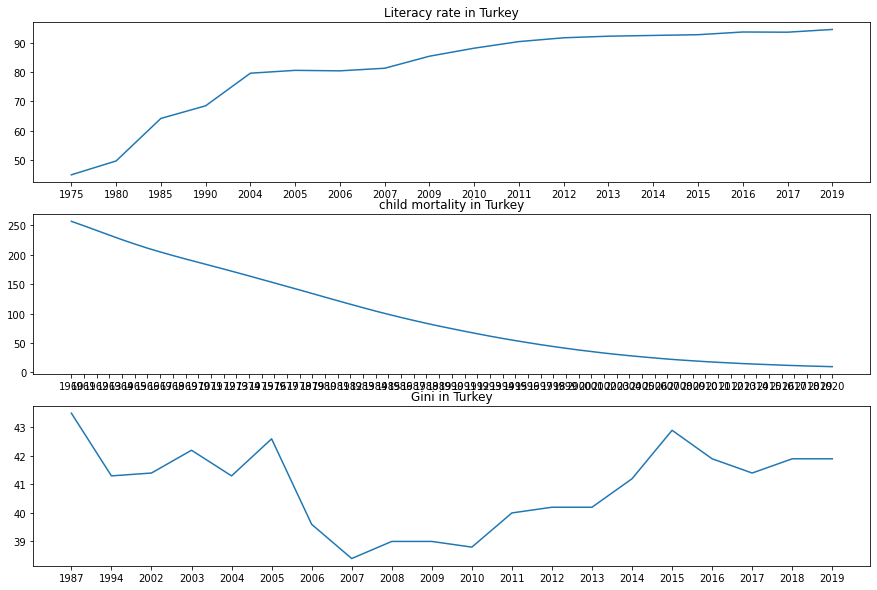

In [102]:
fig, ax = plt.subplots(3,figsize = (15,10))
ax[0].plot(literacy_rate.loc[literacy_rate["Country or Area"]== 'Turkiye']["Value"].dropna())
ax[0].set_title('Literacy rate in Turkey')
ax[1].plot(child_mortality.loc[child_mortality["Country or Area"]== 'Turkiye']["Value"].dropna())
ax[1].set_title('child mortality in Turkey')
ax[2].plot(gini.loc[gini["Country or Area"]== 'Turkiye']["Value"].dropna())
ax[2].set_title('Gini in Turkey')



## Plotting data for other countries

Then I chose the data for the Greece, Bulgaria, Romania, Poland, Syria countries according to the "Country or Area" column and I plotted with subplot.

Text(0.5, 1.0, 'Gini in Iran')

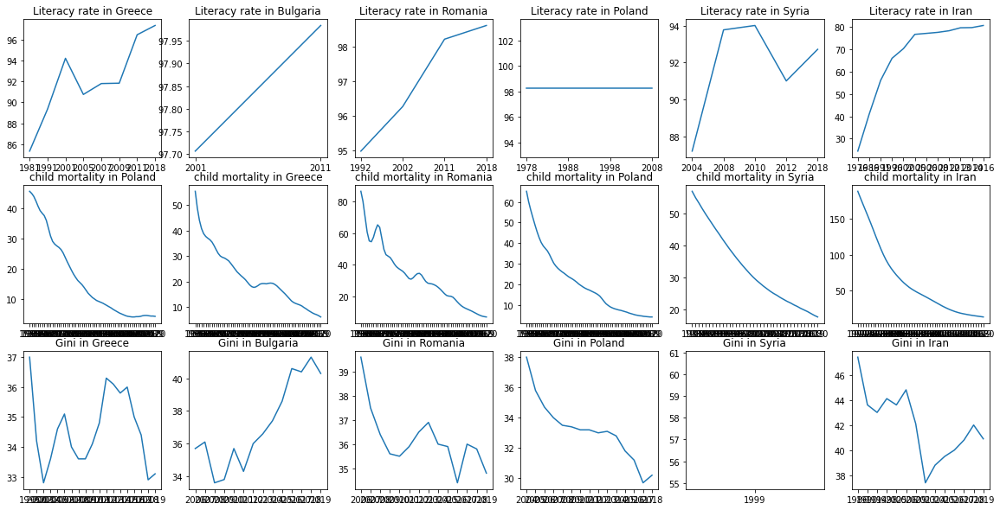

In [101]:
fig, ax = plt.subplots(3,6,figsize = (20,10)) 
ax[0,0].plot(literacy_rate[(literacy_rate["Country or Area"]== 'Greece')]["Value"].dropna())
ax[0,0].set_title('Literacy rate in Greece')

ax[0,1].plot(literacy_rate[(literacy_rate["Country or Area"]== 'Bulgaria')]["Value"].dropna())
ax[0,1].set_title('Literacy rate in Bulgaria')

ax[0,2].plot(literacy_rate[(literacy_rate["Country or Area"]== 'Romania')]["Value"].dropna())
ax[0,2].set_title('Literacy rate in Romania')

ax[0,3].plot(literacy_rate[(literacy_rate["Country or Area"]== 'Poland')]["Value"].dropna())
ax[0,3].set_title('Literacy rate in Poland')

ax[0,4].plot(literacy_rate[(literacy_rate["Country or Area"]== 'Suriname')]["Value"].dropna())
ax[0,4].set_title('Literacy rate in Syria')

ax[0,5].plot(literacy_rate[(literacy_rate["Country or Area"]== 'Iran, Islamic Rep.')]["Value"].dropna())
ax[0,5].set_title('Literacy rate in Iran')

ax[1,0].plot(child_mortality[(child_mortality["Country or Area"]== 'Greece')]["Value"].dropna())
ax[1,0].set_title('child mortality in Poland')

ax[1,1].plot(child_mortality[(child_mortality["Country or Area"]== 'Bulgaria')]["Value"].dropna())
ax[1,1].set_title('child mortality in Greece')

ax[1,2].plot(child_mortality[(child_mortality["Country or Area"]== 'Romania')]["Value"].dropna())
ax[1,2].set_title('child mortality in Romania')

ax[1,3].plot(child_mortality[(child_mortality["Country or Area"]== 'Poland')]["Value"].dropna())
ax[1,3].set_title('child mortality in Poland')

ax[1,4].plot(child_mortality[(child_mortality["Country or Area"]== 'Suriname')]["Value"].dropna())
ax[1,4].set_title('child mortality in Syria')

ax[1,5].plot(child_mortality[(child_mortality["Country or Area"]== 'Iran, Islamic Rep.')]["Value"].dropna())
ax[1,5].set_title('child mortality in Iran')

ax[2,0].plot(gini[(gini["Country or Area"]== 'Greece')]["Value"].dropna())
ax[2,0].set_title('Gini in Greece')

ax[2,1].plot(gini[(gini["Country or Area"]== 'Bulgaria')]["Value"].dropna())
ax[2,1].set_title('Gini in Bulgaria')

ax[2,2].plot(gini[(gini["Country or Area"]== 'Romania')]["Value"].dropna())
ax[2,2].set_title('Gini in Romania')

ax[2,3].plot(gini[(gini["Country or Area"]== 'Poland')]["Value"].dropna())
ax[2,3].set_title('Gini in Poland')

ax[2,4].plot(gini[(gini["Country or Area"]== 'Suriname')]["Value"].dropna())
ax[2,4].set_title('Gini in Syria')

ax[2,5].plot(gini[(gini["Country or Area"]== 'Iran, Islamic Rep.')]["Value"].dropna())
ax[2,5].set_title('Gini in Iran')


## Doing scatter plot

I assigned these values to lr,cm and gn variables to scatter plot the literacy rate, child mortality and gini data in Turkey.

In [103]:
lr = literacy_rate[(literacy_rate["Country or Area"]== 'Turkiye')]["Value"]
cm = child_mortality[(child_mortality["Country or Area"]== 'Turkiye')]["Value"]
gn =  gini[(gini["Country or Area"]== 'Turkiye')]["Value"]

<AxesSubplot:xlabel='Value', ylabel='Value'>

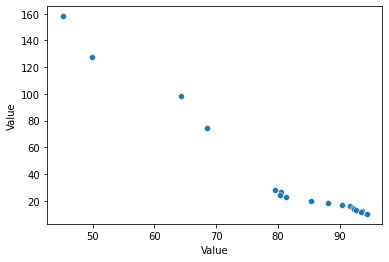

In [104]:
sns.scatterplot(x=lr , y=cm)

I noticed that there is a linear relationship between literacy rate and child mortality. Since the slope of the curve is negative, we can say that literacy rate and child mortality are neg correlated.

<AxesSubplot:xlabel='Value', ylabel='Value'>

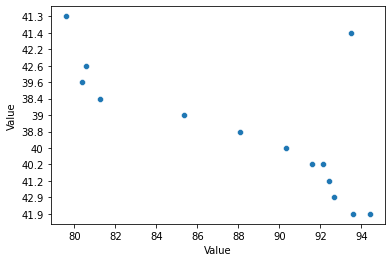

In [65]:
sns.scatterplot(x = lr, y = gn)

I also see a negative linear relationship between literacy rate and gini.

<AxesSubplot:xlabel='Value', ylabel='Value'>

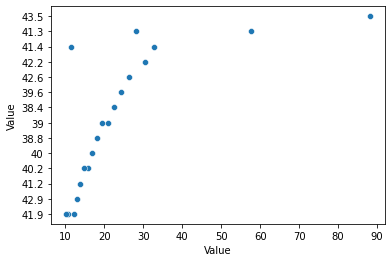

In [66]:
sns.scatterplot(x = cm, y= gn)

In this figure, I see a positive linear relationship between child mortality and gini .

## Question 2

Use Istanbul Municipality Data Server to retrieve the data on [Rail Transportation Data](https://data.ibb.gov.tr/dataset/yas-grubuna-gore-rayli-sistemler-istasyon-bazli-yolcu-ve-yolculuk-sayilari).

1. Explore the dataset and explain each column.
2. Notice that the longitude and lattitude data is not recorded correctly. However, it is easy to correct the data. Explain how you would correct it and then write a function to correct it.
3. Notice that the passenger information is split according to age brackets. Find the total number of passengers for each station ~~in each month~~ and store it in a pandas dataframe. Then plot it on a map of Istanbul. Use disks of different sizes depending on the total number of passengers.
4. Write a function that accepts the age bracket as input (<20, 20-30, 30-60, 60+, unknown) and returns a probability an array of maps (dictionaries) of the form

    {Station Name: probability that the specific age bracket uses the station}
5. The return value for the function you wrote above is a probability distribution on the set of stations, i.e. the usage patterns of different age brackets. Figure out which stations are favored by each age bracket.
6. How do we check that the usage patterns for different age brackets are different? Use your idea to write a code to check for these differences.

## Getting Data

In [110]:
with urlopen('https://data.ibb.gov.tr/dataset/d3df8db4-1ac6-4bfe-8896-7ec1159caa2b/resource/7aec630d-2757-4da0-97f1-71b140abd818/download/2021-yl-ya-grubuna-gore-rayl-sistemler-istasyon-bazl-yolcu-ve-yolculuk-saylar.xlsx') as url:
    data = pd.read_excel(url.read())

data.head(5)

,passage_cnt,passanger_cnt,transaction_year,transaction_month,line,station_name,station_number,town,latitude,longitude,Age-Group
0,7.424,4.227,2.021,1,F1-TAKSIM-KABATAS FUNIKILER HATTI,KABATAS,KTS-TKS,Beyoğlu,410340555555556,289920277777778,20-30
1,18.374,9.479,2.021,1,F1-TAKSIM-KABATAS FUNIKILER HATTI,KABATAS,KTS-TKS,Beyoğlu,410340555555556,289920277777778,30-60
2,3.190,1.430,2.021,1,F1-TAKSIM-KABATAS FUNIKILER HATTI,KABATAS,KTS-TKS,Beyoğlu,410340555555556,289920277777778,60+
3,949.000,469.000,2.021,1,F1-TAKSIM-KABATAS FUNIKILER HATTI,KABATAS,KTS-TKS,Beyoğlu,410340555555556,289920277777778,<20
4,8.673,4.222,2.021,1,F1-TAKSIM-KABATAS FUNIKILER HATTI,KABATAS,KTS-TKS,Beyoğlu,410340555555556,289920277777778,Unknown


## Getting the longitude and latitude columns into proper form

While I trying to convert the "longitude" and "latitude" columns to float I noticed that there were datetime and "[NULL]" values and deleted this data.
After converting the data to float, I multiply it by 10^-13 and set the decimal part


In [111]:
data =data.loc[data["latitude"] != "[NULL]"]
data =data.loc[data["longitude"] != "[NULL]"]

data = data.dropna(axis=0, subset=['latitude'])
data = data.dropna(axis=0, subset=['longitude'])


Also I noticed there is a date value in the longitude column and I deleted that data

In [112]:
data = data.astype({'longitude':'str'})
data = data.loc[data["longitude"] != "2022-09-29 00:00:00"]
data = data.astype({'latitude':'float'})
data = data.astype({'longitude':'float'})
data["latitude"] = data["latitude"]* (10**-13)
data["longitude"] = data["longitude"]* (10**-13)

In [113]:
data.head(5)

,passage_cnt,passanger_cnt,transaction_year,transaction_month,line,station_name,station_number,town,latitude,longitude,Age-Group
0,7.424,4.227,2.021,1,F1-TAKSIM-KABATAS FUNIKILER HATTI,KABATAS,KTS-TKS,Beyoğlu,41.034056,28.992028,20-30
1,18.374,9.479,2.021,1,F1-TAKSIM-KABATAS FUNIKILER HATTI,KABATAS,KTS-TKS,Beyoğlu,41.034056,28.992028,30-60
2,3.190,1.430,2.021,1,F1-TAKSIM-KABATAS FUNIKILER HATTI,KABATAS,KTS-TKS,Beyoğlu,41.034056,28.992028,60+
3,949.000,469.000,2.021,1,F1-TAKSIM-KABATAS FUNIKILER HATTI,KABATAS,KTS-TKS,Beyoğlu,41.034056,28.992028,<20
4,8.673,4.222,2.021,1,F1-TAKSIM-KABATAS FUNIKILER HATTI,KABATAS,KTS-TKS,Beyoğlu,41.034056,28.992028,Unknown


##  Finding the total number of passengers for each station



In [115]:
df = pd.DataFrame(data.groupby("station_name").sum()["passanger_cnt"])
df

,passanger_cnt
station_name,
4 Levent 2 Güney,978.156
4 Levent Kuzey,1253.533
AKSARAY,2445.726
AKSARAY 1,805.858
ALTINŞEHİR,2832.002
...,...
Şehitlik,1409.887
Şişhane Güney,1005.997
Şişhane Kuzey,1383.547


## Plotting the passanger counts on Istanbul Map

In [116]:
map = folium.Map(location=[41, 29], zoom_start=10)
fg = folium.FeatureGroup(name="Map")

latitude = list(data["latitude"])
longitude = list(data["longitude"])
size = minmax_scale(data['passanger_cnt'], feature_range=(10, 50))

for lat,long,siz in zip(latitude,longitude, size):
    fg.add_child(folium.CircleMarker(location = [lat,long], radius = siz, color = 'black', fill_color='red',fill_opacity = 0.6))

map.add_child(fg)

## Finding the probability distribution for stations of each age bracket

I kept the station names in an array and for each station I divided the total number of passengers in the age bracket by the number of passengers in that age bracket at the station.

In [121]:
stations = np.unique(data["station_name"])
dictt = {}

def func(age):
    
    for station in stations:
        s1 = sum(data.loc[(data["station_name"]==station)&(data["Age-Group"]==age)]["passanger_cnt"])
        s2 = sum(data.loc[data["Age-Group"]==age]["passanger_cnt"])
        dictt[station] = s1/s2
    return dictt
        

In [122]:
func("20-30")

{'4 Levent 2 Güney': 0.003837602511575541,
 '4 Levent Kuzey': 0.0043245122070594754,
 'AKSARAY': 0.007923050094122105,
 'AKSARAY 1': 0.002820833380638623,
 'ALTINŞEHİR': 0.0015102805835458422,
 'ATAKOY': 0.010922098072572654,
 'Acıbadem (Batı)': 0.000737042937664117,
 'Acıbadem (Doğu)': 0.0007960755652229016,
 'Aksaray': 0.008520076660523372,
 'Akıncılar': 0.0012099608493906099,
 'Akşemsettin': 0.0035771889212355477,
 'Ali Fuat Başgil': 0.0031614096006124114,
 'Altunizade 1': 0.006069894171205713,
 'Altunizade 2': 0.0023653449835771135,
 'Ataköy': 0.0009787898681399177,
 'Atalar': 0.0012366525307682648,
 'Atatürk Oto Sanayi Güney': 0.0009721005255140985,
 'Atatürk Oto Sanayi Kuzey': 0.0007475203532007932,
 'Atatürk Öğrenci Yurdu': 0.009770392529420968,
 'Aydıntepe': 0.0011308054530163496,
 'Ayrılıkçeşme': 0.009724541519736958,
 'Ayrılıkçeşmesi': 0.012407515322070645,
 'BAGCILAR MEYDAN': 0.005969543083630822,
 'BAHCELIEVLER': 0.002833073454379484,
 'BAKIRKOY': 0.002988833319416358,
 'BA

## Finding favorite station of age bracket

For each age brackets, using the function I created above, I chose the largest of the stations' probabilities. then I added these stations to the max_stat list and converted them to df

In [123]:
ages = np.unique(data["Age-Group"])
max_stat = []
for i in ages:
    age_dictionary = func(i)
    fav_station = max(age_dictionary.keys(), key=(lambda new_k: age_dictionary[new_k]))
    max_stat.append(fav_station)
    
df_age = pd.DataFrame({"favorite station":max_stat},index = ages)
df_age

,favorite station
20-30,Mahmutbey M7 Hol 2
30-60,Çayırova
60+,Güzelyalı
<20,Küçükyalı-2
Unknown,Darıca


## Checking that the usage patterns for different age brackets are different

For testing, I assigned the values I got from the libraries to the arrays. Then I tested these arrays with a loop and calculated the pvalues.

In [125]:
pr_20_30 = list(func("20-30").values())
pr_30_60 = list(func("30-60").values())
pr_over_60 = list(func("60+").values())
pr_less_20 = list(func("<20").values())
pr_unknown = list(func("Unknown").values())

age_br = [pr_20_30,pr_30_60,pr_over_60,pr_less_20,pr_unknown]

pvalues = []

for ab in age_br:
    for ab2 in age_br:
        pval = stats.ttest_ind(ab,ab2)[1]
        pvalues.append(pval)
        

In [126]:
pval = [1- pv for pv in pvalues]
pval

[0.0,
 0.0,
 2.0761170560490427e-14,
 1.6209256159527285e-14,
 4.218847493575595e-15,
 0.0,
 0.0,
 2.375877272697835e-14,
 1.865174681370263e-14,
 4.551914400963142e-15,
 2.0761170560490427e-14,
 2.375877272697835e-14,
 0.0,
 5.551115123125783e-15,
 1.0658141036401503e-14,
 1.6209256159527285e-14,
 1.865174681370263e-14,
 5.551115123125783e-15,
 0.0,
 7.216449660063518e-15,
 4.218847493575595e-15,
 4.551914400963142e-15,
 1.0658141036401503e-14,
 7.216449660063518e-15,
 0.0]

## Evaluation
I used t test to test the difference of two different independent samples. Since all 1-pvalue values are less than 0.05, we cannot say that there is a statistical difference for the station preferences of the age brackets.

# Question 3

For this question use Yahoo Finance API via [yfinance](https://pypi.org/project/yfinance/) library. Retrieve the data for Microsoft [MSFT], Apple [AAPL] and NASDAQ-100 [NDX]. from January 1, 2000.

1. Calculate the log of each series, and then calculate the first derivative of the result. What you got is called the [log-return](https://core.ac.uk/download/pdf/161062652.pdf) of each series. 
2. Merge the series you obtain in Step 1 into a single pandas dataframe.
3. Plot the histograms of results you obtained above (use 10 bins).
4. Plot all three series in a single plot to compare. Do you see a relationship? 
5. How do we see if there are any correlations between these series? What is the statistically correct way of testing it? Find the right statistical test and measure all three correlations.

## Getting Data

In [158]:
MSFT = yf.Ticker("MSFT")
MSFT = MSFT.history(start="2000-01-01")
MSFT

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2000-01-03 00:00:00-05:00,36.810188,37.202202,35.124524,36.555378,53228400,0.0,0.0
2000-01-04 00:00:00-05:00,35.614545,36.731787,35.202929,35.320534,54119000,0.0,0.0
2000-01-05 00:00:00-05:00,34.850093,36.496554,34.301273,35.692924,64059600,0.0,0.0
2000-01-06 00:00:00-05:00,35.183321,35.712541,33.987676,34.497295,54976600,0.0,0.0
2000-01-07 00:00:00-05:00,34.066079,35.202922,33.654464,34.948112,62013600,0.0,0.0
...,...,...,...,...,...,...,...
2022-10-04 00:00:00-04:00,245.089996,250.360001,244.979996,248.880005,34888400,0.0,0.0
2022-10-05 00:00:00-04:00,245.990005,250.580002,244.100006,249.199997,20347100,0.0,0.0
2022-10-06 00:00:00-04:00,247.929993,250.339996,246.080002,246.789993,20239900,0.0,0.0


In [159]:
AAPL = yf.Ticker("AAPL")
AAPL = AAPL.history(start="2000-01-01")
AAPL

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2000-01-03 00:00:00-05:00,0.799515,0.857643,0.775214,0.853355,535796800,0.0,0.0
2000-01-04 00:00:00-05:00,0.825244,0.843349,0.771403,0.781409,512377600,0.0,0.0
2000-01-05 00:00:00-05:00,0.790938,0.842873,0.785221,0.792844,778321600,0.0,0.0
2000-01-06 00:00:00-05:00,0.809044,0.815714,0.724232,0.724232,767972800,0.0,0.0
2000-01-07 00:00:00-05:00,0.735668,0.769974,0.728045,0.758538,460734400,0.0,0.0
...,...,...,...,...,...,...,...
2022-10-04 00:00:00-04:00,145.029999,146.220001,144.259995,146.100006,87830100,0.0,0.0
2022-10-05 00:00:00-04:00,144.070007,147.380005,143.009995,146.399994,79471000,0.0,0.0
2022-10-06 00:00:00-04:00,145.809998,147.539993,145.220001,145.429993,68402200,0.0,0.0


In [160]:
NDX = yf.Ticker("NDX")
NDX = NDX.history(start="2000-01-01")
NDX

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2000-01-03 00:00:00-05:00,3755.739990,3836.860107,3643.250000,3790.550049,1510070000,0,0
2000-01-04 00:00:00-05:00,3766.570068,3766.570068,3542.729980,3546.199951,1511840000,0,0
2000-01-05 00:00:00-05:00,3543.129883,3576.169922,3371.750000,3507.310059,1735670000,0,0
2000-01-06 00:00:00-05:00,3488.310059,3513.550049,3334.020020,3340.810059,1598320000,0,0
2000-01-07 00:00:00-05:00,3337.260010,3529.750000,3314.750000,3529.600098,1634930000,0,0
...,...,...,...,...,...,...,...
2022-10-03 00:00:00-04:00,11059.169922,11296.429688,10985.009766,11229.730469,4415440000,0,0
2022-10-04 00:00:00-04:00,11477.849609,11609.250000,11462.370117,11582.540039,5004780000,0,0
2022-10-05 00:00:00-04:00,11429.469727,11647.620117,11312.519531,11573.179688,4091860000,0,0


In [161]:
NDX.dropna(inplace = True)
MSFT.dropna(inplace = True)
AAPL.dropna(inplace = True)

## Calculating the log-return of each data

In [162]:
assets = [MSFT,AAPL,NDX]

def getlog(assets):
    for asset in assets:
        asset['Log_Returns'] = np.log(asset['Close']) - np.log(asset["Close"].shift(1))
    
getlog(assets)

## Merging the series I obtain in Step 1

In [163]:
df = {"AAPL":AAPL["Log_Returns"] , "MSFT": MSFT["Log_Returns"], "NDX":NDX["Log_Returns"]}
log_ret_df = pd.DataFrame(df)


In [166]:
log_ret_df.dropna(inplace= True)
log_ret_df

,AAPL,MSFT,NDX
Date,,,
2000-01-04 00:00:00-05:00,-0.088077,-0.034364,-0.066635
2000-01-05 00:00:00-05:00,0.014527,0.010488,-0.011027
2000-01-06 00:00:00-05:00,-0.090514,-0.034072,-0.048636
2000-01-07 00:00:00-05:00,0.046281,0.012984,0.054971
2000-01-10 00:00:00-05:00,-0.017744,0.007264,0.051843
...,...,...,...
2022-10-03 00:00:00-04:00,0.030289,0.033108,0.023289
2022-10-04 00:00:00-04:00,0.025300,0.033253,0.030934
2022-10-05 00:00:00-04:00,0.002051,0.001285,-0.000808


## Plotting the histograms 

Text(0.5, 1.0, 'NDX')

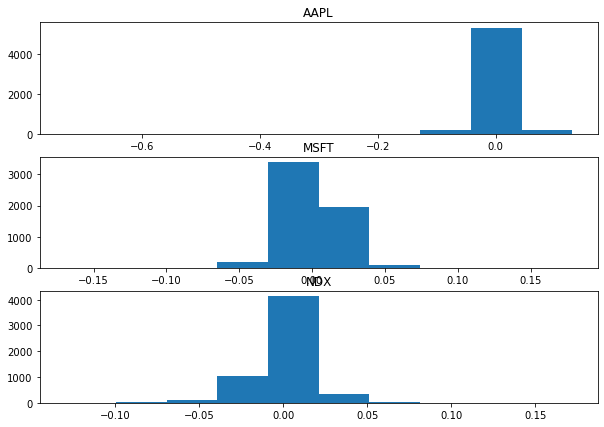

In [167]:
fig, ax = plt.subplots(3,figsize = (10,7))
ax[0].hist(log_ret_df.AAPL, bins = 10)
ax[0].set_title("AAPL")
ax[1].hist(log_ret_df.MSFT, bins = 10)
ax[1].set_title("MSFT")
ax[2].hist(log_ret_df.NDX, bins = 10)
ax[2].set_title("NDX")

## Plotting all three series in a single plot

When I look at the figure, I can see that the log returns are correlated, especially NDX and MSFT.

<AxesSubplot:xlabel='Date'>

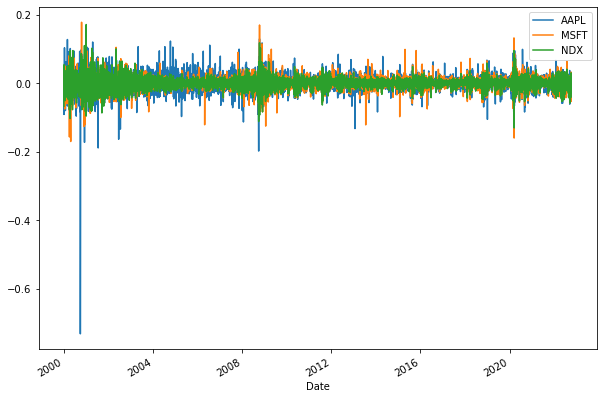

In [168]:
log_ret_df.plot(figsize=(10,7))

## Testing Correlation

In [173]:
pearsonr(log_ret_df.AAPL, log_ret_df.MSFT)

(0.4616033352799724, 2.5789158236341232e-300)

In [174]:
pearsonr(log_ret_df.AAPL, log_ret_df.NDX)

(0.6477755183065345, 0.0)

In [172]:
pearsonr(log_ret_df.NDX, log_ret_df.MSFT)

(0.7470837459586971, 0.0)

## Evaluation

I used the pearson correlation test because the financial data are not independent. We cannot say that there is a statistical difference between log returns because the pvalue values are less than 0.05.